In [1]:
import geopandas as gpd
import rasterio
from rasterio.plot import show as rastershow
import os
from matplotlib import pyplot as plt
import numpy as np
from shapely import Polygon, Point

Baumkataster ground truth

In [2]:
baumkataster = gpd.read_file('/home/k/k202141/workdir/shared_data/2024-ufz-deeptree/halle-baumkataster/itc005211130105323_point.shp')
baumkataster = baumkataster.to_crs(epsg=25832) # need this in the same coordinate system
baumkataster.head()

,standort,hoehe_m,baum_nr,krone_m,stammu_cm,art_deu,gid,pflanzjahr,art_botan,strasse,geometry
0,None,2 - 5,000001,2 - 5,18.0,Kleinkronige Winterlinde,69872,2018.0,Tilia cordata 'Rancho',Max-Sauerlandt-Ring,POINT (702588.616 5710928.347)
1,None,None,000001,None,NaN,None,69850,NaN,None,None,POINT (702737.05 5708872.125)
2,Straße,2 - 5,000002,2 - 5,20.0,Winter-Linde,69874,2020.0,Tilia cordata,Max-Sauerlandt-Ring,POINT (702583.404 5710940.491)
3,None,2 - 5,000003,None,18.0,Kleinkronige Winterlinde,69875,2018.0,Tilia cordata 'Rancho',Max-Sauerlandt-Ring,POINT (702578.018 5710953.036)
4,None,2 - 5,000004,None,18.0,Kleinkronige Winterlinde,69876,2018.0,Tilia cordata 'Rancho',Max-Sauerlandt-Ring,POINT (702573.288 5710963.769)


Segmented trees ground truth

In [3]:
segmented_trees = gpd.read_file('/work/ka1176/shared_data/2024-ufz-deeptree/polygon-labelling/labels/all_labels.shp')
segmented_trees.head()

,class,id,geometry
0,0.0,NaN,"POLYGON ((704006.919 5709953.981, 704007.922 5..."
1,0.0,NaN,"POLYGON ((704029.35 5709936.794, 704030.126 57..."
2,0.0,NaN,"POLYGON ((704032.327 5709930.838, 704032.781 5..."
3,0.0,NaN,"POLYGON ((704041.52 5709926.631, 704043.268 57..."
4,0.0,NaN,"POLYGON ((704005.203 5709932.327, 704006.951 5..."


Tiles we will use for fine-tuning in a cross-validation setting

In [4]:
tile_root = '/work/ka1176/shared_data/2024-ufz-deeptree/polygon-labelling/tiles/'
tiles = np.sort(os.listdir(tile_root))
len(tiles)

20

In [5]:
sort_idx = np.arange(len(tiles))
rng = np.random.default_rng(3465405694)
rng.shuffle(sort_idx)

tiles = tiles[sort_idx]

We will use 5-fold cross validation. Each row in the following panel corresponds to one validation set.

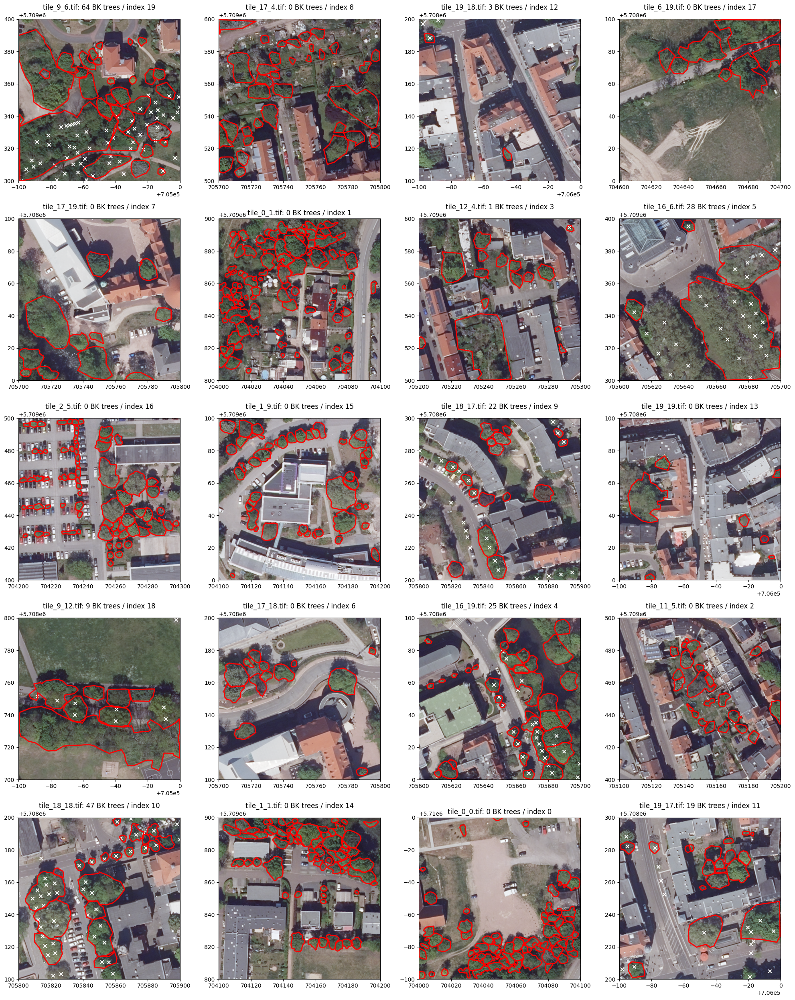

In [6]:
fig, axs = plt.subplots(5, 4, figsize=(20, 25))

baumkataster_trees = []

for ax, idx, tile in zip(axs.flatten(), sort_idx, tiles):
    raster = rasterio.open(os.path.join(tile_root, tile))

    zoom_box = {'left': raster.bounds.left, 'right': raster.bounds.right, 'bottom': raster.bounds.bottom, 'top': raster.bounds.top}
    zbox0 = Polygon( (Point(zoom_box['left'], zoom_box['bottom']), Point(zoom_box['right'], zoom_box['bottom']), Point(zoom_box['right'], zoom_box['top']), Point(zoom_box['left'], zoom_box['top']), ) )
    gg = baumkataster[baumkataster.within(zbox0)]
    st = segmented_trees[segmented_trees.within(zbox0)]
    
    rastershow(raster, ax=ax)
    if len(gg) > 0:
        gg.plot(ax=ax, marker='x', color='white')
    if len(st) > 0:
        st.plot(ax=ax, edgecolor='red', lw=2, facecolor='none', alpha=1.0)
    ax.set_title(f'{tile}: {len(gg)} BK trees / index {idx}')

    baumkataster_trees.append(len(gg))

fig.tight_layout()

Indices for the config script for cross-validation

In [7]:
splits = 5
sort_idx = sort_idx.reshape(splits, -1)
train_sort_idx = np.arange(16)

for split in range(splits):
    val_idx = list(sort_idx[split])
    train_idx = list(sort_idx[:split].flatten()) + list(sort_idx[split+1:].flatten())
    rng.shuffle(train_sort_idx)
    print(f'Split {split}/{splits}')
    print(f'  train_indices: {list(np.array(train_idx)[train_sort_idx])}')
    print(f'  val_indices: {val_idx}')

Split 0/5
  train_indices: [14, 4, 16, 15, 9, 13, 6, 1, 11, 5, 0, 10, 3, 18, 2, 7]
  val_indices: [19, 8, 12, 17]
Split 1/5
  train_indices: [10, 19, 0, 16, 14, 18, 6, 17, 4, 15, 2, 12, 11, 9, 8, 13]
  val_indices: [7, 1, 3, 5]
Split 2/5
  train_indices: [0, 11, 18, 6, 2, 10, 12, 4, 14, 5, 1, 7, 19, 3, 8, 17]
  val_indices: [16, 15, 9, 13]
Split 3/5
  train_indices: [13, 9, 12, 10, 19, 14, 8, 16, 15, 5, 0, 7, 1, 17, 11, 3]
  val_indices: [18, 6, 4, 2]
Split 4/5
  train_indices: [5, 17, 7, 12, 16, 15, 1, 4, 8, 2, 19, 3, 13, 9, 18, 6]
  val_indices: [10, 14, 0, 11]


This is the labeled hold-out test set. It contains a variety of scenes we encounter when segmenting tree crowns in Halle.

- `tile_0_4.tif`: roofs, streets, vegetation, few trees, with Baumkataster trees
- `tile_18_19.tif`: roofs, streets, and cars, few trees, with Baumkataster trees
- `tile_1_8.tif`: industrial area, vegetation and trees, but no Baumkataster trees
- `tile_2_10.tif`: green area, vegetation and trees, but no Baumkataster trees
- `tile_8_6.tif`: green area, vegetation and trees, many Baumkataster trees

In [8]:
tile_root = '/work/ka1176/shared_data/2024-ufz-deeptree/polygon-labelling/test_tiles/'
tiles = np.sort(os.listdir(tile_root))
len(tiles)

5

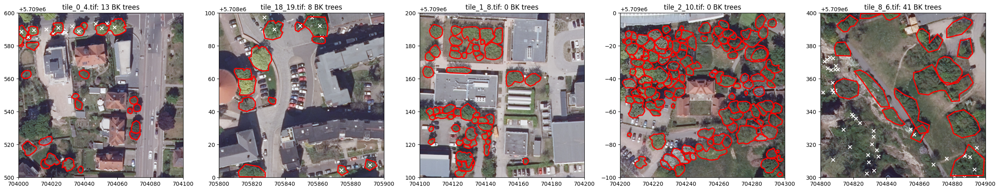

In [9]:
fig, axs = plt.subplots(1, 5, figsize=(25, 5))

baumkataster_trees = []

for ax, tile in zip(axs, tiles):
    raster = rasterio.open(os.path.join(tile_root, tile))

    zoom_box = {'left': raster.bounds.left, 'right': raster.bounds.right, 'bottom': raster.bounds.bottom, 'top': raster.bounds.top}
    zbox0 = Polygon( (Point(zoom_box['left'], zoom_box['bottom']), Point(zoom_box['right'], zoom_box['bottom']), Point(zoom_box['right'], zoom_box['top']), Point(zoom_box['left'], zoom_box['top']), ) )
    gg = baumkataster[baumkataster.within(zbox0)]
    st = segmented_trees[segmented_trees.within(zbox0)]

    rastershow(raster, ax=ax)
    if len(gg) > 0:
        gg.plot(ax=ax, marker='x', color='white')
    if len(st) > 0:
        st.plot(ax=ax, edgecolor='red', lw=2, facecolor='none', alpha=1.0)
    ax.set_title(f'{tile}: {len(gg)} BK trees')

    baumkataster_trees.append(len(gg))

fig.tight_layout()